## Introduction

**Last Updated**: 03/09/2024

**Embedded Capacity Register**: For each DNO/IDNO Party, this refers to a register of site-specific data items for sites connected to the DNO/IDNO Party's Distribution System (or those with an accepted connection offer), which: 

(a) Have an import capacity of any size and are subject to a DSR Contract of 50kW or more; and/or  
(b) Have an export capacity of any size and a registered capacity of 50kW or more.  

The required register format and data items are described in Schedule 31 (Embedded Capacity Register).

This Embedded Capacity Register (ECR) includes details of connected generation (including storage) and flexible demand resources connected to the DNO/IDNO's Distribution System.

**Generation assets** are included if the registered capacity is greater than or equal to 50kW.  
**Sites providing Demand Side Response (DSR)** are included if the contracted capacity is greater than or equal to 50kW.

The ECR is divided into two parts:

- **Part 1**: Provides information on generation (including storage) assets.
- **Part 2**: Provides information on demand sites offering Demand Side Response (DSR) services.

The sheets that make up the ECR are:

- **Definitions Part 1**: Describes the different data fields used in Part 1 of the ECR.
- **Register Part 1**: Comprises a list of generation (including storage) assets.
- **Definitions Part 2 (DSR)**: Describes the different data fields used in Part 2 of the ECR.
- **Register Part 2**: Comprises a list of demand sites providing DSR services.

<br></br>

[Note]: Features description is found **[here](./features.md)**

In [224]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import streamlit as st
import geopandas as gpd
import os, ast
from dotenv import load_dotenv

Get Module Verions

In [225]:
import matplotlib, plotly
for mod in [pd, np, matplotlib, st, plotly, gpd]:
    print(f'{mod.__name__}=={mod.__version__}')

pandas==2.2.2
numpy==1.26.4
matplotlib==3.9.2
streamlit==1.38.0
plotly==5.24.0
geopandas==1.0.1


## Loading Process

**Sheets Loaded**
The workbook contains the following sheets, which have been loaded into a pandas DataFrame:

- **sheet index 2**. Register Part 1 50kW - <1MW
   - **Description:** This sheet includes data related to energy connections with capacities ranging from 50 kW to less than 1 MW.

 - **sheet index 3**. Register Part 1 - ≥1MW
   - **Description:** This sheet includes data for energy connections with capacities of 1 MW or greater.

**Data Structure**
- **Header Row:** The second row of each sheet is used as the header, which defines the column names for the data.
- **Combined Data:** The data from both sheets has been concatenated into a single DataFrame (by adding 1 under 2) for analysis, allowing for a comprehensive view of all connections across the specified capacity ranges.

In [226]:
df_dict = pd.read_excel("./datastore/nged ecr sep 2024.xlsx", sheet_name=[2,3], header=1)
type(df_dict)

dict

In [227]:
df_dict.keys()

dict_keys([2, 3])

## Preprocessing

Here, columns will be renamed for ease of use

Combine data to one

In [228]:
raw_data = pd.concat([df_dict[2], df_dict[3]]) # concat along rows
raw_data.shape

(6312, 50)

In [229]:
raw_data.head()

,Export MPAN / MSID,Town/ City,County,Location (X-coordinate):Eastings (where data is held),Location (y-coordinate):Northings (where data is held),Grid Supply Point,Bulk Supply Point,Primary,Point of Connection (POC)\nVoltage (kV),Licence Area,...,Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Distribution Service Provider (Y/N),Transmission Service Provider (Y/N),Reference,In a Connection Queue (Y/N),Distribution Reinforcement Reference,Transmission Reinforcement Reference,Last Updated
0,1170000124890,Spalding,Lincolnshire,521470,316790,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,National Grid Electricity Distribution (East M...,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1,1170001725100,Spalding,Lincolnshire,520170,314820,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,National Grid Electricity Distribution (East M...,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
2,1170001870001,Spalding,Lincolnshire,548330,321730,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,National Grid Electricity Distribution (East M...,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
3,1170000386383,Boston,Lincolnshire,521680,349910,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,National Grid Electricity Distribution (East M...,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
4,1170000165637,Peterborough,Cambridgeshire,514070,316420,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,National Grid Electricity Distribution (East M...,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03


In [230]:
raw_data.columns

Index(['Export MPAN / MSID', 'Town/ City ', 'County ',
       'Location (X-coordinate):Eastings (where data is held)',
       'Location (y-coordinate):Northings (where data is held)',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary',
       'Point of Connection (POC)\nVoltage (kV)', 'Licence Area ',
       'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Storage Capacity 1 (MWh)',
       'Storage Duration 1 (Hours)',
       'Energy Source & Energy Conversion Technology 1 - Registered Capacity (MW)',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Storage Capacity 2 (MWh)',
       'Storage Duration 2 (Hours)',
       'Energy Source & Energy Conversion Technology 2 - Registered Capacity (MW)',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Storage Capacity 3 (MWh)',
       'Storage Duration 3 (Hours)',
       'Energy Source & Energy Con

Remove extract space from feature names

In [231]:
raw_data.columns = [col.strip() for col in raw_data.columns]
raw_data.columns

Index(['Export MPAN / MSID', 'Town/ City', 'County',
       'Location (X-coordinate):Eastings (where data is held)',
       'Location (y-coordinate):Northings (where data is held)',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary',
       'Point of Connection (POC)\nVoltage (kV)', 'Licence Area',
       'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Storage Capacity 1 (MWh)',
       'Storage Duration 1 (Hours)',
       'Energy Source & Energy Conversion Technology 1 - Registered Capacity (MW)',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Storage Capacity 2 (MWh)',
       'Storage Duration 2 (Hours)',
       'Energy Source & Energy Conversion Technology 2 - Registered Capacity (MW)',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Storage Capacity 3 (MWh)',
       'Storage Duration 3 (Hours)',
       'Energy Source & Energy Conver

In [232]:

try:
	raw_data.rename(columns={'Location (X-coordinate):Eastings (where data is held)': 'Eastings',
						  	 'Export MPAN / MSID': 'Export MPAN_MSID',
                         	 'Location (y-coordinate):Northings (where data is held)': 'Northings',
							 'Point of Connection (POC)\nVoltage (kV)': 'PoC Voltage (KV)',
							 'Energy Source & Energy Conversion Technology 1 - Registered Capacity (MW)': 'Reg_Cap_Energy_Source_Conv_Tech_1',
							 'Energy Source & Energy Conversion Technology 2 - Registered Capacity (MW)': 'Reg_Cap_Energy_Source_Conv_Tech_2',
							 'Town/ City': 'Town_City', 'Export MPAN / MSID': 'Export MPAN_MSID', 'Import MPAN / MSID': 'Import MPAN_MSID',
							 'Energy Source & Energy Conversion Technology 3 - Registered Capacity (MW)': 'Reg_Cap_Energy_Source_Conv_Tech_3'
                         },
                         inplace=True)

	# raw_data.drop(labels=['Location (X-coordinate):\nEastings (where data is held)', 'Location (y-coordinate):\nNorthings (where data is held)'],
	# 					axis=1,
	# 					inplace=True)
except KeyError:
	print('Columns already renamed\n')
raw_data.columns

Index(['Export MPAN_MSID', 'Town_City', 'County', 'Eastings', 'Northings',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary', 'PoC Voltage (KV)',
       'Licence Area', 'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Storage Capacity 1 (MWh)',
       'Storage Duration 1 (Hours)', 'Reg_Cap_Energy_Source_Conv_Tech_1',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Storage Capacity 2 (MWh)',
       'Storage Duration 2 (Hours)', 'Reg_Cap_Energy_Source_Conv_Tech_2',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Storage Capacity 3 (MWh)',
       'Storage Duration 3 (Hours)', 'Reg_Cap_Energy_Source_Conv_Tech_3',
       'Flexible Connection (Yes/No)', 'Connection Status',
       'Already connected Registered Capacity (MW)',
       'Maximum Export Capacity (MW)', 'Maximum Export Capacity (MVA)',
       'Maximum Import Capacity (MW)', 'Maximu

In [233]:
raw_data.set_index('Export MPAN_MSID', inplace=True)

Rename Licence Area fields

In [234]:
def rename_LA_fields(area: str):
    match area:
        case 'National Grid Electricity Distribution (East Midlands) Plc':
            return 'East Midlands'
        case 'National Grid Electricity Distribution (West Midlands) Plc':
            return 'West Midlands'
        case 'National Grid Electricity Distribution (South West) Plc':
            return 'South West'
        case 'National Grid Electricity Distribution (South Wales) Plc':
            return 'South Wales'
        case _:
            return pd.NA
        
    

raw_data['Licence Area'] = raw_data['Licence Area'].apply(rename_LA_fields)

In [235]:
raw_data['Licence Area'].value_counts()

Licence Area
East Midlands    2094
West Midlands    1704
South West       1672
South Wales       842
Name: count, dtype: int64

In [236]:
raw_data.head()

,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Distribution Service Provider (Y/N),Transmission Service Provider (Y/N),Reference,In a Connection Queue (Y/N),Distribution Reinforcement Reference,Transmission Reinforcement Reference,Last Updated
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
1170000124890,Spalding,Lincolnshire,521470,316790,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170001725100,Spalding,Lincolnshire,520170,314820,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170001870001,Spalding,Lincolnshire,548330,321730,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170000386383,Boston,Lincolnshire,521680,349910,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170000165637,Peterborough,Cambridgeshire,514070,316420,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03


### Missing Values

Looking at features with all values missing

Flexible connection

In [237]:
raw_data['Flexible Connection (Yes/No)'].value_counts()

Series([], Name: count, dtype: int64)

Storage Duration

In [238]:
print(f"{raw_data['Storage Duration 1 (Hours)'].value_counts()}\n\n{raw_data['Storage Duration 2 (Hours)'].value_counts()}\n\n{raw_data['Storage Duration 3 (Hours)'].value_counts()}")

Series([], Name: count, dtype: int64)

Series([], Name: count, dtype: int64)

Series([], Name: count, dtype: int64)


Storage Capacity

In [239]:
print(f"{raw_data['Storage Capacity 1 (MWh)'].value_counts()}\n\n{raw_data['Storage Capacity 2 (MWh)'].value_counts()}\n\n{raw_data['Storage Capacity 3 (MWh)'].value_counts()}")

Series([], Name: count, dtype: int64)

Series([], Name: count, dtype: int64)

Series([], Name: count, dtype: int64)


Same goes for:
- Distribution Service Provider (Y/N)
- Transmission Service Provider (Y/N)
- Reference
- In a Connection Queue (Y/N)
- Distribution Reinforcement Reference
- Transmission Reinforcement Reference

So these 13 features will be dropped.

First change 'data not available' to `np.nan`

In [240]:

# Strip extra whitespace from all string columns
raw_data = raw_data.applymap(lambda x: x.strip() if isinstance(x, str) else x)

raw_data.replace(r'(?i)--REDACTED--', np.nan, inplace=True, regex=True)
raw_data.head(4)

C:\Users\abume\AppData\Local\Temp\ipykernel_1596\2845294706.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

C:\Users\abume\AppData\Local\Temp\ipykernel_1596\2845294706.py:4: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Distribution Service Provider (Y/N),Transmission Service Provider (Y/N),Reference,In a Connection Queue (Y/N),Distribution Reinforcement Reference,Transmission Reinforcement Reference,Last Updated
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
1170000124890,Spalding,Lincolnshire,521470.0,316790.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170001725100,Spalding,Lincolnshire,520170.0,314820.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170001870001,Spalding,Lincolnshire,548330.0,321730.0,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170000386383,Boston,Lincolnshire,521680.0,349910.0,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03


### Change data types

Change `object` to accurate types - `float`, `date`


In [241]:
# to float
selected_floats = ['PoC Voltage (KV)',
				   'Maximum Export Capacity (MW)', 'Maximum Import Capacity (MW)',
				   'Maximum Export Capacity (MVA)', 'Maximum Import Capacity (MVA)',
                   'Already connected Registered Capacity (MW)', 'Accepted to Connect Registered Capacity (MW)',
				   'Reg_Cap_Energy_Source_Conv_Tech_2', 'Reg_Cap_Energy_Source_Conv_Tech_3']

# to int
selected_ints = ['Eastings', 'Northings']

# to date
selected_dates = ['Date Connected', 'Last Updated', 'Date Accepted', 'Target Energisation Date']

raw_data[selected_floats] = raw_data[selected_floats].astype('float')
raw_data[selected_ints] = raw_data[selected_ints].apply(pd.to_numeric, errors='coerce')
raw_data['Date Accepted'] = pd.to_datetime(raw_data['Date Accepted'], format='%d/%m/%Y', errors='coerce')

raw_data.sample(5)

,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Distribution Service Provider (Y/N),Transmission Service Provider (Y/N),Reference,In a Connection Queue (Y/N),Distribution Reinforcement Reference,Transmission Reinforcement Reference,Last Updated
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
2100041055932,Llanelli,Dyfed,253110.0,201960.0,Swansea North Grid,Trostre Grid,Westfa,0.4,South Wales,Solar,...,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
2200042535998,Bristol,North Somerset,364930.0,178520.0,Iron Acton Sgp,Lockleaze Bsp 132Kv,Mangotsfield,11.0,South West,Solar,...,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
NaN,Exeter road industrial estate,Okehampton,260284.0,955620.0,Alverdiscott Sgp,Pyworthy Bsp,Okehampton,0.4,South West,Stored Energ,...,0.22737,NaT,2024-12-01,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
2200043160698,Bath,Bath And North East Somerset,374580.0,164410.0,Melksham Sgp,Bath (Dolemeads) 132,Dorchester St - New,0.4,South West,Solar,...,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03
1170001452248,Northampton,Northamptonshire,NaN,NaN,Grendon 132Kv S Stn,Northampton East 33Kv S Stn,Boothville 33 11Kv S Stn,0.4,East Midlands,Solar,...,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-03


In [242]:
data = raw_data.drop(labels=['Flexible Connection (Yes/No)',
                             'Storage Capacity 1 (MWh)', 'Storage Capacity 2 (MWh)', 'Storage Capacity 2 (MWh)', 'Storage Capacity 3 (MWh)',
                             'Storage Duration 1 (Hours)', 'Storage Duration 2 (Hours)', 'Storage Duration 3 (Hours)',
                             'Distribution Service Provider (Y/N)', 'Transmission Service Provider (Y/N)',
                             'Reference',
                             'In a Connection Queue (Y/N)',
                             'Distribution Reinforcement Reference', 'Transmission Reinforcement Reference'],
                	axis=1)

data.shape

(6312, 36)

In [243]:
gdata = gpd.GeoDataFrame(data)

gdata.head()

,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Maximum Import Capacity (MVA),Date Connected,Accepted to Connect Registered Capacity (MW),Change to Maximum Export Capacity (MW),Change to Maximum Export Capacity (MVA),Change to Maximum Import Capacity (MW),Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Last Updated
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
1170000124890,Spalding,Lincolnshire,521470.0,316790.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,0.200,2013-08-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03
1170001725100,Spalding,Lincolnshire,520170.0,314820.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,0.069,2023-03-15,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03
1170001870001,Spalding,Lincolnshire,548330.0,321730.0,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,Solar,...,0.150,2023-07-25,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03
1170000386383,Boston,Lincolnshire,521680.0,349910.0,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,Solar,...,0.070,2014-06-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03
1170000165637,Peterborough,Cambridgeshire,514070.0,316420.0,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,East Midlands,Solar,...,0.045,2014-05-01,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03


In [244]:
gdata.geometry = gpd.points_from_xy(x=gdata.Eastings, y=gdata.Northings)
gdata.set_crs('EPSG:27700', inplace=True).head()

C:\Users\abume\AppData\Roaming\Python\Python312\site-packages\geopandas\geodataframe.py:221: FutureWarning:

You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.



,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Date Connected,Accepted to Connect Registered Capacity (MW),Change to Maximum Export Capacity (MW),Change to Maximum Export Capacity (MVA),Change to Maximum Import Capacity (MW),Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Last Updated,geometry
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
1170000124890,Spalding,Lincolnshire,521470.0,316790.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,2013-08-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (521470 316790)
1170001725100,Spalding,Lincolnshire,520170.0,314820.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,2023-03-15,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (520170 314820)
1170001870001,Spalding,Lincolnshire,548330.0,321730.0,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,Solar,...,2023-07-25,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (548330 321730)
1170000386383,Boston,Lincolnshire,521680.0,349910.0,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,Solar,...,2014-06-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (521680 349910)
1170000165637,Peterborough,Cambridgeshire,514070.0,316420.0,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,East Midlands,Solar,...,2014-05-01,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (514070 316420)


In [245]:
long_lat_gdata = gdata.to_crs(crs="EPSG:4326")

long_lat_gdata.head()

,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,Energy Source 1,...,Date Connected,Accepted to Connect Registered Capacity (MW),Change to Maximum Export Capacity (MW),Change to Maximum Export Capacity (MVA),Change to Maximum Import Capacity (MW),Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Last Updated,geometry
Export MPAN_MSID,,,,,,,,,,,,,,,,,,,,,
1170000124890,Spalding,Lincolnshire,521470.0,316790.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,2013-08-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (-0.2024 52.73511)
1170001725100,Spalding,Lincolnshire,520170.0,314820.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,Solar,...,2023-03-15,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (-0.22236 52.7177)
1170001870001,Spalding,Lincolnshire,548330.0,321730.0,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,Solar,...,2023-07-25,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (0.19735 52.77279)
1170000386383,Boston,Lincolnshire,521680.0,349910.0,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,Solar,...,2014-06-30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (-0.18692 53.03264)
1170000165637,Peterborough,Cambridgeshire,514070.0,316420.0,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,East Midlands,Solar,...,2014-05-01,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2024-09-03,POINT (-0.31207 52.73339)


In [246]:
fig = px.choropleth(data_frame=long_lat_gdata, geojson=long_lat_gdata['geometry'], locations='Licence Area')
fig.show()

###  Export Preprocessed

Export the preproessed data to csv format for ECRapp.py

In [247]:
data.to_csv('datastore/preprocess_ecr.csv')
gdata.to_file('datastore/preprocessed_geojson.geojson', driver='GeoJSON')
gdata.to_csv('datastore/geo_preprocessed_ecr.csv')

C:\Users\abume\AppData\Roaming\Python\Python312\site-packages\pyogrio\geopandas.py:523: UserWarning:

GeoSeries.notna() previously returned False for both missing (None) and empty geometries. Now, it only returns False for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use '~s.is_empty & s.notna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.notna', UserWarning)



In [248]:
geojson_data = gpd.read_file('datastore/preprocessed_geojson.geojson')
geojson_data.head()

,Export MPAN_MSID,Town_City,County,Eastings,Northings,Grid Supply Point,Bulk Supply Point,Primary,PoC Voltage (KV),Licence Area,...,Date Connected,Accepted to Connect Registered Capacity (MW),Change to Maximum Export Capacity (MW),Change to Maximum Export Capacity (MVA),Change to Maximum Import Capacity (MW),Change to Maximum Import Capacity (MVA),Date Accepted,Target Energisation Date,Last Updated,geometry
0,1170000124890,Spalding,Lincolnshire,521470.0,316790.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,...,2013-08-30,NaN,NaN,NaN,NaN,NaN,None,NaT,2024-09-03,POINT (521470 316790)
1,1170001725100,Spalding,Lincolnshire,520170.0,314820.0,Walpole 132Kv S Stn,Spalding Clay Lake 33Kv S Stn,Crowland 33 11Kv S Stn,0.4,East Midlands,...,2023-03-15,NaN,NaN,NaN,NaN,NaN,None,NaT,2024-09-03,POINT (520170 314820)
2,1170001870001,Spalding,Lincolnshire,548330.0,321730.0,Walpole 132Kv S Stn,South Holland 33Kv S Stn,Long Sutton 33 11Kv S Stn,0.4,East Midlands,...,2023-07-25,NaN,NaN,NaN,NaN,NaN,None,NaT,2024-09-03,POINT (548330 321730)
3,1170000386383,Boston,Lincolnshire,521680.0,349910.0,Walpole 132Kv S Stn,Boston 33Kv S Stn,Langrick 33 11Kv S Stn,0.4,East Midlands,...,2014-06-30,NaN,NaN,NaN,NaN,NaN,None,NaT,2024-09-03,POINT (521680 349910)
4,1170000165637,Peterborough,Cambridgeshire,514070.0,316420.0,Walpole 132Kv S Stn,Stamford 33Kv S Stn,Market Deeping 33 11Kv S Stn,0.4,East Midlands,...,2014-05-01,NaN,NaN,NaN,NaN,NaN,None,NaT,2024-09-03,POINT (514070 316420)


In [249]:
type(geojson_data[['Town_City', 'Grid Supply Point', 'Bulk Supply Point', 'Eastings', 'Northings', 'Licence Area']])

pandas.core.frame.DataFrame

In [250]:
# ['Date Connected', 'Last Updated', 'Date Accepted', 'Target Energisation Date']
import folium

selected_features = ['Town_City', 'Primary', 'Bulk Supply Point', 'Grid Supply Point', 'Licence Area', 'Eastings', 'Northings', 'geometry', 'Accepted to Connect Registered Capacity (MW)', 'Connection Status']# data['Target Energisation Date'].dt.date]
bounds = geojson_data.total_bounds

layers = (geojson_data.drop(selected_dates, axis=1)[selected_features]
          .explore(column='Licence Area',
                   tiles="CartoDB dark_matter",
                   vmin=bounds[1], vmax=bounds[3],
                   scheme='JenksCaspallForced'
                   ))

folium.LayerControl().add_to(layers)
layers

In [251]:
geojson_data.groupby('Energy Source 1')[['Accepted to Connect Registered Capacity (MW)', 'Already connected Registered Capacity (MW)', 'Maximum Export Capacity (MW)', 'Maximum Import Capacity (MW)']].sum()

,Accepted to Connect Registered Capacity (MW),Already connected Registered Capacity (MW),Maximum Export Capacity (MW),Maximum Import Capacity (MW)
Energy Source 1,,,,
Advanced Fuel,22.49100,26.810000,17.10000,130.15000
Biofuel - Biogas from anaerobic digestion,25.91200,83.048725,72.75005,32.80540
Biofuel - Landfill gas,64.49900,267.386000,237.65770,28.71850
Biofuel - Other,3.58000,10.730000,3.36870,17.19500
Biofuel - Sewage gas,2.03000,48.766000,47.46675,56.25995
Biomass,62.10000,208.005000,186.26080,38.09310
Fossil - Coal gas,0.20000,5.352000,4.75000,0.14250
Fossil - Gas,290.95300,920.163700,883.55613,165.80160
Fossil - Oil,29.18000,543.154000,417.96770,298.67905


In [252]:
geojson_data.groupby('Energy Source 2')[['Accepted to Connect Registered Capacity (MW)', 'Already connected Registered Capacity (MW)', 'Maximum Export Capacity (MW)', 'Maximum Import Capacity (MW)']].sum()

,Accepted to Connect Registered Capacity (MW),Already connected Registered Capacity (MW),Maximum Export Capacity (MW),Maximum Import Capacity (MW)
Energy Source 2,,,,
Advanced Fuel,0.0000,0.095000,0.03325,0.09500
Biofuel - Biogas from anaerobic digestion,0.0000,82.990000,45.63800,33.53500
Biofuel - Landfill gas,0.0000,9.612000,7.41000,3.83800
Biofuel - Other,0.0000,3.052805,5.46060,7.38435
Biofuel - Sewage gas,0.0000,0.204000,0.17005,0.47120
Biomass,13.1470,52.990000,120.37925,3.97955
Fossil - Gas,0.7800,24.202600,27.01705,48.10230
Fossil - Oil,0.0000,17.110000,5.51380,122.40750
Fossil - Other,0.7500,9.400000,7.70925,4.56950


In [253]:
geojson_data.groupby('Energy Source 3')[['Accepted to Connect Registered Capacity (MW)', 'Already connected Registered Capacity (MW)', 'Maximum Export Capacity (MW)', 'Maximum Import Capacity (MW)']].sum()

,Accepted to Connect Registered Capacity (MW),Already connected Registered Capacity (MW),Maximum Export Capacity (MW),Maximum Import Capacity (MW)
Energy Source 3,,,,
Fossil - Gas,0.000,19.257000,3.90450,22.8000
Solar,422.000,36.595805,21.29235,22.3915
Stored Energ,114.968,32.980000,19.22325,1.1780
Waste,0.000,3.932000,1.14000,1.3300
Wind,203.000,13.183000,7.45750,14.5920


In [254]:
geojson_data.pivot_table(columns='Energy Conversion Technology 1', index='Energy Source 1', values='Reg_Cap_Energy_Source_Conv_Tech_1', fill_value=0,  margins=True, margins_name='Total', aggfunc='sum')

Energy Conversion Technology 1,Engine (combustion / reciprocating),Gas turbine (OCGT),Geothermal power plant,Hydro - Other,Hydro - Reservoir (not pumped),Hydro - Run of river,Offshore wind turbines,Onshore wind turbines,Photovoltaic,Steam turbine (thermal power plant),Steam-gas turbine (CCGT),Storage - Electrochemical (Batteries),Storage - Mechanical - Flywheel,Storage - Thermal,Total
Energy Source 1,,,,,,,,,,,,,,,
Advanced Fuel,22.0610,12.520,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,11.600,0.000,0.000,0.000,0.0,46.181000
Biofuel - Biogas from anaerobic digestion,93.3640,11.328,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,0.250,0.000,0.000,0.000,0.0,104.942000
Biofuel - Landfill gas,24.3090,301.654,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,0.330,4.278,0.000,0.000,0.0,330.571000
Biofuel - Other,8.7990,1.760,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,1.750,0.000,0.000,0.000,0.0,12.309000
Biofuel - Sewage gas,5.9690,38.066,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,5.000,0.000,0.000,0.000,0.0,49.035000
Biomass,0.0000,0.000,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,263.660,0.000,0.000,0.000,0.0,263.660000
Fossil - Coal gas,5.5520,0.000,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,0.000,0.000,0.000,0.000,0.0,5.552000
Fossil - Gas,878.0837,316.822,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,2.000,0.000,0.000,0.000,0.0,1196.905700
Fossil - Oil,484.9720,7.500,0.000,0.000,0.000,0.0000,0.0,0.0000,0.000000,0.040,0.000,0.000,0.000,0.0,492.512000


In [255]:
geojson_data.pivot_table(columns='Energy Conversion Technology 2', index='Energy Source 2', values='Reg_Cap_Energy_Source_Conv_Tech_2', fill_value=0, margins=True, margins_name='Total',aggfunc='sum')

Energy Conversion Technology 2,Engine (combustion / reciprocating),Gas turbine (OCGT),Hydro - Other,Hydro - Reservoir (not pumped),Hydro - Run of river,Offshore wind turbines,Onshore wind turbines,Photovoltaic,Steam turbine (thermal power plant),Steam-gas turbine (CCGT),Storage - Electrochemical (Batteries),Storage - Thermal,Tidal stream devices,Total
Energy Source 2,,,,,,,,,,,,,,
Advanced Fuel,0.000,0.035,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,0.000,0.0000,0.000,0.000,0.035000
Biofuel - Biogas from anaerobic digestion,28.290,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,0.000,0.0000,0.000,0.000,28.290000
Biofuel - Landfill gas,1.180,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,3.000,0.0000,0.000,0.000,4.180000
Biofuel - Other,0.045,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,0.079,0.550,0.0000,0.000,0.000,0.674000
Biofuel - Sewage gas,0.015,0.020,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,0.000,0.0000,0.000,0.000,0.035000
Biomass,0.000,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,11.580,0.000,0.0000,0.000,0.000,11.580000
Fossil - Gas,3.965,1.190,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,1.282,0.0000,0.000,0.000,6.437000
Fossil - Oil,1.425,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,0.000,0.0000,0.000,0.000,1.425000
Fossil - Other,3.925,0.000,0.00,0.00,0.00,0.0,0.00,0.000000,0.000,0.000,0.0000,0.000,0.000,3.925000


In [256]:
geojson_data.pivot_table(columns='Energy Conversion Technology 3', index='Energy Source 3', values='Reg_Cap_Energy_Source_Conv_Tech_3', fill_value=0, margins=True, margins_name='Total', aggfunc='sum')

Energy Conversion Technology 3,Engine (combustion / reciprocating),Onshore wind turbines,Photovoltaic,Steam turbine (thermal power plant),Storage - Electrochemical (Batteries),Storage - Mechanical - Compressed Air (Adiabatic & Diabatic),Total
Energy Source 3,,,,,,,
Fossil - Gas,2.0,0.00,0.000000,0.0,0.000,0.00,2.000000
Solar,0.0,0.00,53.472805,0.0,0.000,0.00,53.472805
Stored Energ,0.0,0.00,0.000000,0.0,27.623,0.15,27.773000
Waste,0.0,0.00,0.000000,1.2,0.000,0.00,1.200000
Wind,0.0,68.19,0.000000,0.0,0.000,0.00,68.190000
Total,2.0,68.19,53.472805,1.2,27.623,0.15,152.635805


In [257]:
fig = px.line(
    data_frame=geojson_data.groupby(['Target Energisation Date', 'Energy Source 1'])[['Accepted to Connect Registered Capacity (MW)', 'Maximum Export Capacity (MW)']].agg(
                                                                                                                                                                        {
                                                                                                                                                                            'Accepted to Connect Registered Capacity (MW)': 'sum',
                                                                                                                                                                            'Maximum Export Capacity (MW)': 'sum'
                                                                                                                                                                        }
    ).reset_index(), 
    x='Target Energisation Date', 
    y='Accepted to Connect Registered Capacity (MW)',
    title='Accepted Capacity Over Time for Energy Source 1',
    markers='line+circle',
    color='Energy Source 1',
    # labels={'Target Energisation Date': 'Date', 'Accepted to Connect Registered Capacity (MW)': 'Capacity (MW)'},
    color_discrete_sequence=px.colors.carto.Agsunset
)

fig.show()

In [258]:
fig = px.line(
    data_frame=geojson_data.groupby(['Target Energisation Date', 'Energy Source 2'])[['Accepted to Connect Registered Capacity (MW)', 'Maximum Export Capacity (MW)']].agg(
                                                                                                                                                                        {
                                                                                                                                                                            'Accepted to Connect Registered Capacity (MW)': 'sum',
                                                                                                                                                                            'Maximum Export Capacity (MW)': 'sum'
                                                                                                                                                                        }
    ).reset_index(), 
    x='Target Energisation Date', 
    y='Accepted to Connect Registered Capacity (MW)',
    title='Accepted Capacity Over Time',
    markers='line+circle',
    color='Energy Source 2',
    labels={'Target Energisation Date': 'Date', 'Accepted to Connect Registered Capacity (MW)': 'Capacity (MW)'},
    color_discrete_sequence=px.colors.qualitative.Prism
)

fig.show()

In [259]:
geojson_data.columns

Index(['Export MPAN_MSID', 'Town_City', 'County', 'Eastings', 'Northings',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary', 'PoC Voltage (KV)',
       'Licence Area', 'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_1',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_2',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_3',
       'Connection Status', 'Already connected Registered Capacity (MW)',
       'Maximum Export Capacity (MW)', 'Maximum Export Capacity (MVA)',
       'Maximum Import Capacity (MW)', 'Maximum Import Capacity (MVA)',
       'Date Connected', 'Accepted to Connect Registered Capacity (MW)',
       'Change to Maximum Export Capacity (MW)',
       'Change to Maximum Export Capacity (MVA)',
       'Change to Maximum Import Cap

In [260]:
voltage_energy_group = geojson_data.groupby(['PoC Voltage (KV)']).agg({
												'Accepted to Connect Registered Capacity (MW)': 'sum',
												'Maximum Export Capacity (MW)': 'sum',
												'Maximum Import Capacity (MW)': 'sum',
                                                
											}).reset_index()

fig = px.bar(data_frame=voltage_energy_group,
             x='PoC Voltage (KV)',
             y=['Accepted to Connect Registered Capacity (MW)',
                'Maximum Export Capacity (MW)',
                'Maximum Import Capacity (MW)'],
             barmode='group',
             color_discrete_sequence=['#000080', '#0000FF', '#1E90FF'],
             hover_data={'PoC Voltage (KV)': True},
             labels={'value': 'Capacity (MW)', 'variable': 'Capacity Type'})

fig.update_layout(title='123',
                  yaxis_title='Capacity (MW)',
                  legend_title='Capacity Type',
                  xaxis={'tickmode': 'array',
                         'tickvals': sorted(voltage_energy_group['PoC Voltage (KV)'].unique()),
                         'ticktext': sorted(voltage_energy_group['PoC Voltage (KV)'].unique())})

fig.show()

In [281]:
geojson_data.columns

Index(['Export MPAN_MSID', 'Town_City', 'County', 'Eastings', 'Northings',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary', 'PoC Voltage (KV)',
       'Licence Area', 'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_1',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_2',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_3',
       'Connection Status', 'Already connected Registered Capacity (MW)',
       'Maximum Export Capacity (MW)', 'Maximum Export Capacity (MVA)',
       'Maximum Import Capacity (MW)', 'Maximum Import Capacity (MVA)',
       'Date Connected', 'Accepted to Connect Registered Capacity (MW)',
       'Change to Maximum Export Capacity (MW)',
       'Change to Maximum Export Capacity (MVA)',
       'Change to Maximum Import Cap

In [287]:
# Reshape the data for sunburst chart
load_dotenv()

blues = ast.literal_eval(os.getenv('blues'))

dno_voltage_energy_group = geojson_data.groupby(['Licence Area', 'PoC Voltage (KV)']).agg({
												'Accepted to Connect Registered Capacity (MW)': 'sum',
												'Maximum Export Capacity (MW)': 'sum',
												'Maximum Import Capacity (MW)': 'sum',
                                                
											}).reset_index()

sunburst_data = pd.melt(dno_voltage_energy_group, 
                        id_vars=['Licence Area', 'PoC Voltage (KV)'], 
                        value_vars=['Accepted to Connect Registered Capacity (MW)',
                                    'Maximum Export Capacity (MW)',
                                    'Maximum Import Capacity (MW)'],
                        var_name='Capacity Type', 
                        value_name='Capacity (MW)',
                        )

# Create the sunburst chart
fig = px.sunburst(sunburst_data, 
                  path=['Licence Area', 'PoC Voltage (KV)', 'Capacity Type'], 
                  values='Capacity (MW)',
                  color='Licence Area',
                  color_discrete_sequence=blues,
                  hover_data={'Capacity (MW)': ':.2f'},
                  branchvalues='total',
                  height=600)

fig.update_layout(title='Energy Capacity Distribution by Type and Voltage',
                  margin=dict(t=30, l=0, r=0, b=0))

fig.show()

In [172]:
geojson_data.groupby(['PoC Voltage (KV)'])['Maximum Export Capacity (MW)'].sum()

PoC Voltage (KV)
0.4       480.90784
11.0     2232.59479
33.0     4591.64136
66.0      537.72955
132.0    1139.08135
Name: Maximum Export Capacity (MW), dtype: float64

In [123]:
fig = px.bar(
    data_frame=geojson_data.groupby(['Energy Source 1', 'Energy Source 2', 'Energy Source 3']).agg({
                                                                                                    'Accepted to Connect Registered Capacity (MW)': 'sum',
                                                                                                    'Connection Status': 'count',
                                                                                                    'PoC Voltage (KV)': 'count'
                                                                                                }).reset_index(),
    x='Energy Source 1',  # Use one energy source as the x-axis
    y='Accepted to Connect Registered Capacity (MW)',    # Use the total capacity for the y-axis
    color='Energy Source 3',  # Differentiate bars by Energy Source 3
    barmode='group',
    title='Total Accepted Capacity by Energy Sources',
    labels={
        'Energy Source 1': 'Primary Energy Source',
        'Total Capacity': 'Accepted Capacity (MW)',
        'Energy Source 3': 'Secondary Energy Source'
    }
)

# Update layout for better visibility
fig.update_layout(
    xaxis_title='Primary Energy Source',
    yaxis_title='Accepted Capacity (MW)',
    legend_title='Secondary Energy Source',
)

# Show the plot
fig.show()

In [187]:
geojson_data.groupby(['Energy Source 1', 'Energy Source 2', 'Energy Source 3']).agg({
                                                                                                    'Accepted to Connect Registered Capacity (MW)': 'sum',
                                                                                                    'Connection Status': 'count',
                                                                                                    'PoC Voltage (KV)': 'count'
                                                                                                }).reset_index()

,Energy Source 1,Energy Source 2,Energy Source 3,Accepted to Connect Registered Capacity (MW),Connection Status,PoC Voltage (KV)
0,Biomass,Wind,Solar,0.000,1,1
1,Fossil - Gas,Stored Energ,Solar,0.000,1,1
2,Fossil - Oil,Solar,Wind,0.000,1,1
3,Fossil - Oil,Water,Solar,0.000,1,1
4,Fossil - Other,Biofuel - Other,Solar,0.000,1,1
5,Fossil - Other,Solar,Fossil - Gas,0.000,1,1
6,Solar,Stored Energ,Stored Energ,1.300,1,1
7,Solar,Stored Energ,Wind,67.500,1,1
8,Solar,Water,Stored Energ,0.168,1,1
9,Solar,Wind,Stored Energ,105.500,2,2


In [125]:
geojson_data.columns


Index(['Export MPAN_MSID', 'Town_City', 'County', 'Eastings', 'Northings',
       'Grid Supply Point', 'Bulk Supply Point', 'Primary', 'PoC Voltage (KV)',
       'Licence Area', 'Energy Source 1', 'Energy Conversion Technology 1',
       'CHP Cogeneration (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_1',
       'Energy Source 2', 'Energy Conversion Technology 2',
       'CHP Cogeneration 2 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_2',
       'Energy Source 3', 'Energy Conversion Technology 3',
       'CHP Cogeneration 3 (Yes/No)', 'Reg_Cap_Energy_Source_Conv_Tech_3',
       'Connection Status', 'Already connected Registered Capacity (MW)',
       'Maximum Export Capacity (MW)', 'Maximum Export Capacity (MVA)',
       'Maximum Import Capacity (MW)', 'Maximum Import Capacity (MVA)',
       'Date Connected', 'Accepted to Connect Registered Capacity (MW)',
       'Change to Maximum Export Capacity (MW)',
       'Change to Maximum Export Capacity (MVA)',
       'Change to Maximum Import Cap

## EDA

Statistical exploration

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6312 entries, 1170000124890 to nan
Data columns (total 36 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   Town_City                                     6210 non-null   object        
 1   County                                        4020 non-null   object        
 2   Eastings                                      5258 non-null   float64       
 3   Northings                                     5258 non-null   float64       
 4   Grid Supply Point                             6253 non-null   object        
 5   Bulk Supply Point                             5703 non-null   object        
 6   Primary                                       4904 non-null   object        
 7   PoC Voltage (KV)                              6109 non-null   float64       
 8   Licence Area                                  6312 non-null   

In [47]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
Eastings,5258.0,369474.067516,118310.0,305266.5,383583.5,444899.75,909200.0,94585.317262
Northings,5258.0,312201.216812,20525.0,211419.0,287982.5,342630.0,998448.0,163627.978218
PoC Voltage (KV),6109.0,20.57466,0.4,0.4,11.0,11.0,132.0,37.419112
Reg_Cap_Energy_Source_Conv_Tech_1,6312.0,8.481891,0.001,0.09,0.25,4.32375,280.0,21.861578
Reg_Cap_Energy_Source_Conv_Tech_2,410.0,10.515884,0.005,0.06745,0.4375,9.975,204.0,23.487177
Reg_Cap_Energy_Source_Conv_Tech_3,34.0,4.617641,0.01,0.1,0.5495,1.86,45.0,10.07776
Already connected Registered Capacity (MW),4720.0,2.093135,0.002,0.08,0.166,0.9,97.2,6.213182
Maximum Export Capacity (MW),4533.0,2.022276,0.0,0.076,0.1425,0.855,184.1936,6.467137
Maximum Export Capacity (MVA),4533.0,2.128712,0.0,0.08,0.15,0.9,193.888,6.807512
Maximum Import Capacity (MW),4490.0,0.602549,0.00095,0.0437,0.095,0.24605,119.7,3.299863


Target Energisation Date ranges from 2023 to 2038. Long term plan 👍

In [50]:
data['Energy Conversion Technology 1'].value_counts()

Energy Conversion Technology 1
Photovoltaic                              4274
Onshore wind turbines                      752
Storage - Electrochemical  (Batteries)     479
Engine (combustion / reciprocating)        293
Steam turbine (thermal power plant)        118
Gas turbine (OCGT)                         112
Hydro - Run of river                        40
Geothermal power plant                      10
Offshore wind turbines                       5
Steam-gas turbine (CCGT)                     4
Hydro - Other                                3
Storage - Thermal                            2
Hydro - Reservoir (not pumped)               1
Storage - Mechanical - Flywheel              1
Name: count, dtype: int64

In [51]:
data['Energy Conversion Technology 2'].value_counts()

Energy Conversion Technology 2
Photovoltaic                              160
Storage - Electrochemical  (Batteries)    100
Onshore wind turbines                      29
Engine (combustion / reciprocating)        21
Steam turbine (thermal power plant)         7
Gas turbine (OCGT)                          3
Steam-gas turbine (CCGT)                    3
Hydro - Reservoir (not pumped)              2
Storage - Thermal                           2
Tidal stream devices                        1
Offshore wind turbines                      1
Hydro - Run of river                        1
Hydro - Other                               1
Name: count, dtype: int64

In [52]:
data['Energy Conversion Technology 3'].value_counts()

Energy Conversion Technology 3
Photovoltaic                                                    11
Storage - Electrochemical  (Batteries)                           6
Onshore wind turbines                                            6
Steam turbine (thermal power plant)                              1
Engine (combustion / reciprocating)                              1
Storage - Mechanical - Compressed Air (Adiabatic & Diabatic)     1
Name: count, dtype: int64

In [53]:
data['Energy Source 1'].value_counts()

Energy Source 1
Solar                                        4274
Wind                                          757
Stored Energ                                  482
Fossil - Gas                                  162
Fossil - Oil                                   83
Biofuel - Landfill gas                         75
Biomass                                        68
Water                                          44
Waste                                          40
Biofuel - Biogas from anaerobic digestion      39
Fossil - Other                                 24
Biofuel - Sewage gas                           19
Geothermal                                     10
Biofuel - Other                                 9
Advanced Fuel                                   6
Fossil - Coal gas                               2
Name: count, dtype: int64

In [54]:
data['Energy Source 2'].value_counts()

Energy Source 2
Solar                                        160
Stored Energ                                 102
Wind                                          30
Fossil - Gas                                   7
Fossil - Other                                 6
Biomass                                        6
Water                                          5
Biofuel - Other                                3
Biofuel - Biogas from anaerobic digestion      3
Biofuel - Landfill gas                         3
Fossil - Oil                                   3
Biofuel - Sewage gas                           2
Advanced Fuel                                  1
Name: count, dtype: int64

In [55]:
data['Energy Source 3'].value_counts()

Energy Source 3
Solar           11
Stored Energ     7
Wind             6
Waste            1
Fossil - Gas     1
Name: count, dtype: int64

In [58]:
fig = px.choropleth(data_frame=gdata,
                        locations='Primary',
                        geojson=gdata.geometry)
fig.show()

# import plotly.graph_objects as go

# fig = go.scattergeo(
#     customdata=gdata,
#     geojson=gdata['geometry']
# )

/opt/anaconda3/lib/python3.12/site-packages/shapely/measurement.py:106: RuntimeWarning: invalid value encountered in bounds
  return lib.bounds(geometry_arr, out=out, **kwargs)


In [53]:
fig = px.choropleth(gdata, geojson=gdata.geometry,
                    color=gdata['Licence Area'], color_continuous_scale=px.colors.sequential.Plasma,
                    locations=gdata['County'])
fig.show()

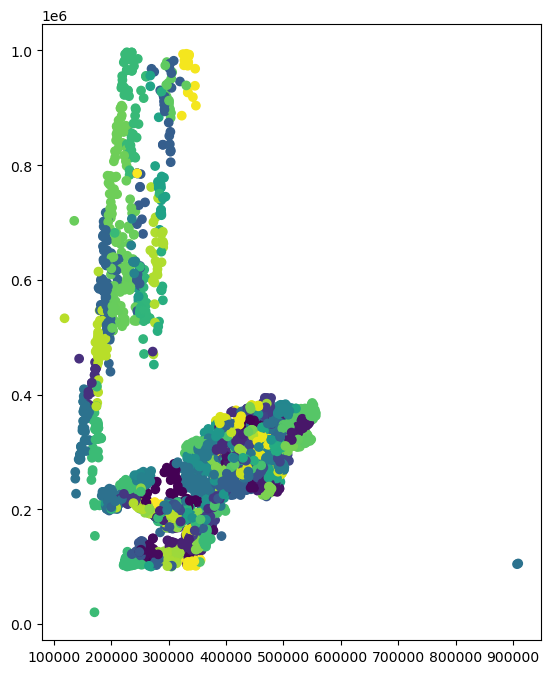

In [65]:
gdata[~gdata['Northings'].isna()].plot(column='Bulk Supply Point', figsize=(14,8), cmap='viridis', legend=False)
plt.show()

In [55]:
gdata.isna().sum()

Town_City                                        102
County                                          2292
Eastings                                        1054
Northings                                       1054
Grid Supply Point                                 59
Bulk Supply Point                                609
Primary                                         1408
PoC Voltage (KV)                                 203
Licence Area                                       0
Energy Source 1                                  218
Energy Conversion Technology 1                   218
CHP Cogeneration (Yes/No)                        446
Reg_Cap_Energy_Source_Conv_Tech_1                  0
Energy Source 2                                 5981
Energy Conversion Technology 2                  5981
CHP Cogeneration 2 (Yes/No)                     5937
Reg_Cap_Energy_Source_Conv_Tech_2               5902
Energy Source 3                                 6286
Energy Conversion Technology 3                